## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## Compute the camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx,fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        wname = '../output_images/chessboard_corners/corners'+str(idx+1)+'.jpg'
        cv2.imwrite(wname, img)
        #cv2.imshow('img',img)
        #cv2.waitKey(500)

cv2.destroyAllWindows()

In [2]:
def corners_unwarp(img, nx, ny, mtx, dist):
    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    undist_gray=cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(undist_gray, (nx,ny), None)
    
    if ret is True:
        cv2.drawChessboardCorners(undist, (nx,ny), corners, ret)
        offset=100
        img_size=(undist_gray.shape[1], undist_gray.shape[0])
        src = np.float32([corners[0],corners[nx-1],corners[-1],corners[-nx]])
        dst = np.float32([[offset, offset],[img_size[0]-offset, offset],[img_size[0]-offset, img_size[1]-offset],[offset, img_size[1]-offset]])
        #print("Corners:\n",corners)
        M = cv2.getPerspectiveTransform(src, dst)
        warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR) 
    else:
        warped = img
        M=0
    return warped, M

In [3]:
for idx, fname in enumerate(images):
    image = cv2.imread(fname)
    ret, mtx, dist,rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (image.shape[1], image.shape[0]), None, None)
    nx = 9
    ny = 6
    top_down, perspectiveM = corners_unwarp(image, nx, ny, mtx, dist)
    wname = '../output_images/calibrated_chessboard/calibrated'+str(idx+1)+'.jpg'
    cv2.imwrite(wname, top_down)
    #print(wname[-16:-4], perspectiveM)

## Distortion Correction in Raw Images

In [4]:
straight1_or = mpimg.imread('../test_images/straight_lines1.jpg')
straight2_or = mpimg.imread('../test_images/straight_lines2.jpg')
test1_or = mpimg.imread('../test_images/test1.jpg')
test2_or = mpimg.imread('../test_images/test2.jpg')
test3_or = mpimg.imread('../test_images/test3.jpg')
test4_or = mpimg.imread('../test_images/test4.jpg')
test5_or = mpimg.imread('../test_images/test5.jpg')
test6_or = mpimg.imread('../test_images/test6.jpg')

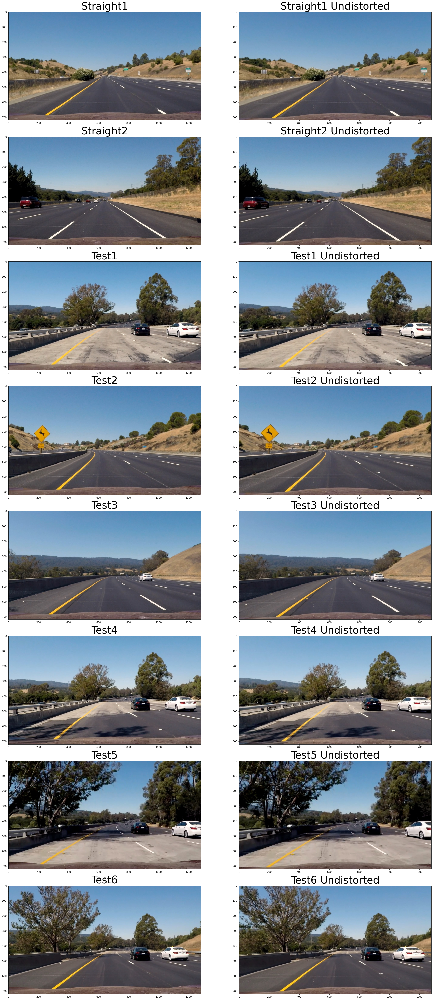

In [5]:

straight1 = cv2.undistort(straight1_or, mtx, dist, None, mtx)
straight2 = cv2.undistort(straight2_or, mtx, dist, None, mtx)
test1 = cv2.undistort(test1_or, mtx, dist, None, mtx)
test2 = cv2.undistort(test2_or, mtx, dist, None, mtx)
test3 = cv2.undistort(test3_or, mtx, dist, None, mtx)
test4 = cv2.undistort(test4_or, mtx, dist, None, mtx)
test5 = cv2.undistort(test5_or, mtx, dist, None, mtx)
test6 = cv2.undistort(test6_or, mtx, dist, None, mtx)

f, ((ax1,ax2),(ax3, ax4),(ax5, ax6),(ax7,ax8),(ax9, ax10), (ax11, ax12), (ax13, ax14), (ax15, ax16)) = plt.subplots(
    8, 2, figsize=(72, 27))
f.tight_layout()

ax1.imshow(straight1_or)
ax1.set_title('Straight1', fontsize=40)

ax2.imshow(straight1)
ax2.set_title('Straight1 Undistorted', fontsize=40)

ax3.imshow(straight2_or)
ax3.set_title('Straight2', fontsize = 40)

ax4.imshow(straight2)
ax4.set_title('Straight2 Undistorted', fontsize = 40)

ax5.imshow(test1_or)
ax5.set_title('Test1', fontsize = 40)

ax6.imshow(test1)
ax6.set_title('Test1 Undistorted', fontsize = 40)

ax7.imshow(test2_or)
ax7.set_title('Test2', fontsize = 40)

ax8.imshow(test2)
ax8.set_title('Test2 Undistorted', fontsize = 40)

ax9.imshow(test3_or)
ax9.set_title('Test3', fontsize = 40)

ax10.imshow(test3)
ax10.set_title('Test3 Undistorted', fontsize = 40)

ax11.imshow(test4_or)
ax11.set_title('Test4', fontsize = 40)

ax12.imshow(test4)
ax12.set_title('Test4 Undistorted', fontsize = 40)

ax13.imshow(test5_or)
ax13.set_title('Test5', fontsize = 40)

ax14.imshow(test5)
ax14.set_title('Test5 Undistorted', fontsize = 40)

ax15.imshow(test6_or)
ax15.set_title('Test6', fontsize = 40)

ax16.imshow(test6)
ax16.set_title('Test6 Undistorted', fontsize = 40)

plt.subplots_adjust(left=0., right=0.35, top=2, bottom=0.)

## Colour and Gradient Transform

In [6]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Calculate directional gradient
    # Apply threshold
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    elif orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    sobel_abs = np.absolute(sobel)
    scaled_sobel = np.uint8(255*sobel_abs/np.max(sobel_abs))
    grad_binary = np.zeros_like(scaled_sobel)
    
    return grad_binary

def mag_thresh(image, sobel_kernel=3, mag_thresh=(0, 255)):
    # Calculate gradient magnitude
    # Apply threshold
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    grad_mag = np.sqrt(sobelx**2 + sobely**2)
    scaled_sobel = np.uint8(255*grad_mag/np.max(grad_mag))
    mag_binary = np.zeros_like(scaled_sobel)
    mag_binary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    
    return mag_binary

def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Calculate gradient direction
    # Apply threshold
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    asobelx = np.absolute(sobelx)
    asobely = np.absolute(sobely)
    d = np.arctan2(asobely, asobelx)
    dir_binary = np.zeros_like(d)
    dir_binary[(d >= thresh[0]) & (d <= thresh[1])] = 1
    
    return dir_binary

def colorgrad_pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100), h_thresh=(20,100), r_thresh=(210, 255), l_thresh=(150, 255)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    r_channel = img[:,:,0]
    h_channel = hls[:,:,0]
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold s channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    # Threshold l channel
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    
    # Threshold h channel
    h_binary = np.zeros_like(s_channel)
    h_binary[(h_channel >= h_thresh[0]) & (h_channel <= h_thresh[1])] = 1
    
    # Threshold r channel
    r_binary = np.zeros_like(r_channel)
    r_binary[(r_channel >= r_thresh[0]) & (r_channel <= r_thresh[1])] = 1
    
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    sxs_binary = np.zeros_like(scaled_sobel)
    sxs_binary[(s_binary == 1) | (sxbinary ==1)] =1
    
    return (color_binary, sxbinary, s_binary, h_binary, r_binary, l_binary)

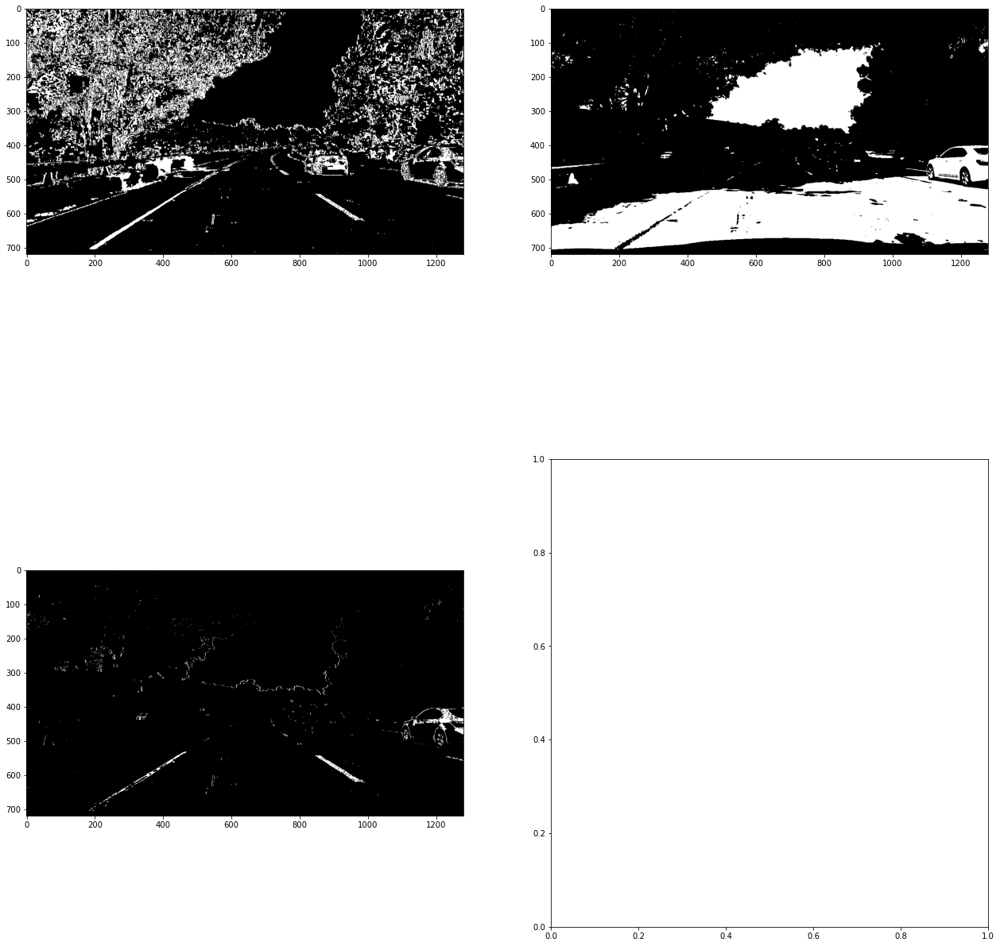

In [7]:
color_binary, sxbinary, s_binary, h_binary, r_binary, l_binary = colorgrad_pipeline(test5)
f, ((ax1,ax2),(ax3, ax4)) = plt.subplots(2, 2, figsize=(24, 9))

sxs_binary = np.zeros_like(sxbinary)
sxs_binary[(s_binary == 1) | (sxbinary ==1)] =1

sxsl_binary = np.zeros_like(sxbinary)
sxsl_binary[(sxs_binary == 1) & (l_binary == 1)] =1

ax1.imshow(sxs_binary, cmap='gray')
ax2.imshow(l_binary, cmap='gray')
ax3.imshow(sxsl_binary, cmap='gray')

plt.subplots_adjust(left=0., right=0.7, top=2, bottom=0.)

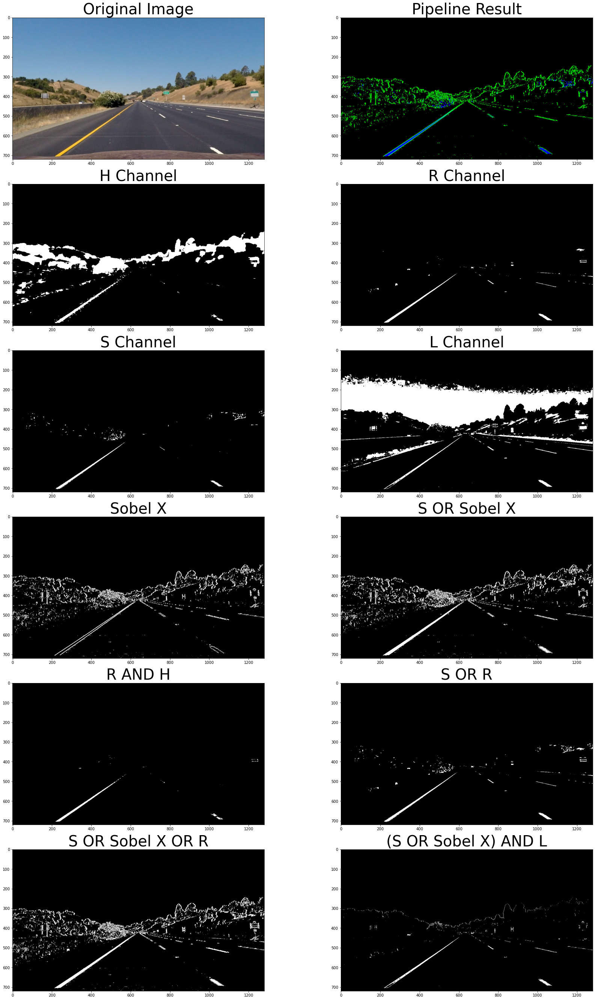

In [8]:
color_binary, sxbinary, s_binary, h_binary, r_binary, l_binary = colorgrad_pipeline(straight1)

# Plot the result
f, ((ax1,ax2),(ax3, ax4),(ax5, ax6),(ax7,ax8),(ax9, ax10),(ax11, ax12)) = plt.subplots(6, 2, figsize=(48, 18))
f.tight_layout()

ax1.imshow(straight1)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(color_binary, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)

ax3.imshow(h_binary, cmap='gray')
ax3.set_title('H Channel', fontsize = 40)

ax4.imshow(r_binary, cmap='gray')
ax4.set_title('R Channel', fontsize = 40)

ax5.imshow(s_binary,cmap='gray')
ax5.set_title('S Channel', fontsize = 40)

ax6.imshow(l_binary, cmap='gray')
ax6.set_title('L Channel', fontsize = 40)

ax7.imshow(sxbinary,cmap='gray')
ax7.set_title('Sobel X', fontsize = 40)

sxs_binary = np.zeros_like(sxbinary)
sxs_binary[(s_binary == 1) | (sxbinary ==1)] =1
ax8.imshow(sxs_binary, cmap = 'gray')
ax8.set_title('S OR Sobel X', fontsize = 40)

rh_binary = np.zeros_like(sxbinary)
rh_binary[(r_binary == 1) & (h_binary ==1)] =1
ax9.imshow(rh_binary, cmap = 'gray')
ax9.set_title('R AND H', fontsize = 40)

sr_binary = np.zeros_like(sxbinary)
sr_binary[(r_binary == 1) | (s_binary ==1)] =1
ax10.imshow(sr_binary, cmap = 'gray')
ax10.set_title('S OR R', fontsize = 40)

sxsr_binary = np.zeros_like(sxbinary)
sxsr_binary[(s_binary == 1) | (sxbinary ==1) | (r_binary == 1)] =1
ax11.imshow(sxsr_binary, cmap = 'gray')
ax11.set_title('S OR Sobel X OR R', fontsize = 40)

sxsl_binary = np.zeros_like(sxbinary)
sxsl_binary[(sxs_binary == 1) & (l_binary == 1)] =1
ax12.imshow(sxsl_binary, cmap = 'gray')
ax12.set_title('(S OR Sobel X) AND L', fontsize = 40)

plt.subplots_adjust(left=0., right=0.5, top=2, bottom=0.)


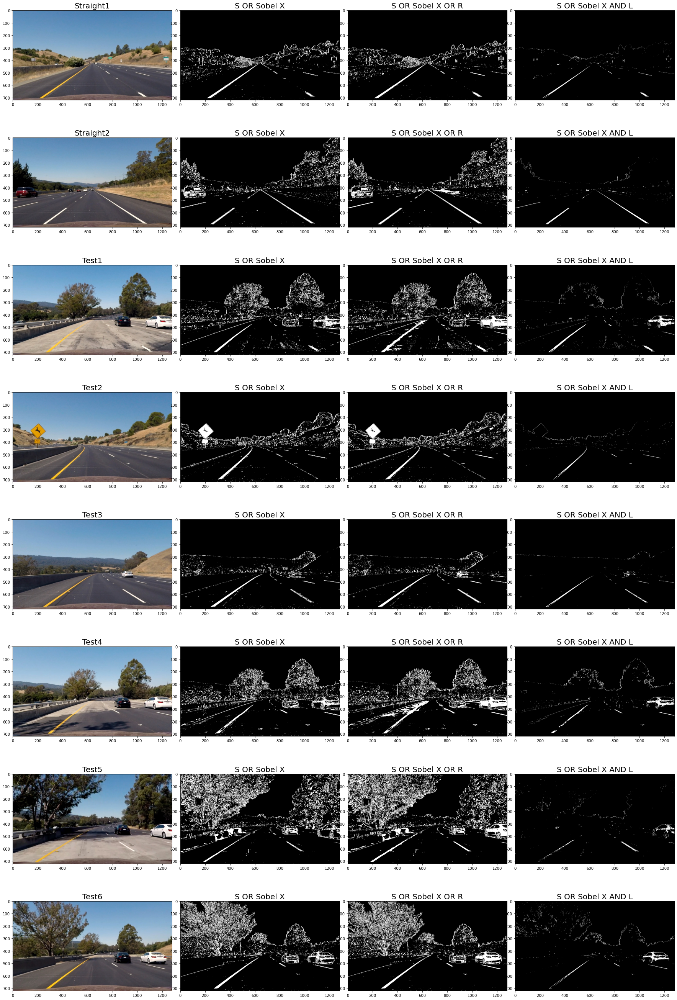

In [9]:
f, ((ax1,ax2,ax3,ax4),(ax5,ax6,ax7,ax8), (ax9,ax10,ax11,ax12),(ax13,ax14,ax15,ax16),
    (ax17,ax18,ax19,ax20),(ax21,ax22,ax23,ax24),(ax25,ax26,ax27,ax28),
    (ax29,ax30,ax31,ax32)) = plt.subplots(8, 4, figsize=(48, 18))
f.tight_layout()

color_binary, sxbinary, s_binary, h_binary, r_binary, l_binary = colorgrad_pipeline(straight1)
sxs_binary_s1 = np.zeros_like(sxbinary)
sxs_binary_s1[(s_binary == 1) | (sxbinary ==1)] = 1
sxsr_binary_s1 = np.zeros_like(sxbinary)
sxsr_binary_s1[(s_binary == 1) | (sxbinary ==1) | (r_binary == 1)] = 1
sxsl_binary_s1 = np.zeros_like(sxbinary)
sxsl_binary_s1[(sxs_binary_s1 == 1) & (l_binary == 1)] =1

ax1.imshow(straight1)
ax1.set_title('Straight1', fontsize=20)

ax2.imshow(sxs_binary_s1, cmap='gray')
ax2.set_title('S OR Sobel X', fontsize=20)

ax3.imshow(sxsr_binary_s1, cmap='gray')
ax3.set_title('S OR Sobel X OR R', fontsize=20)

ax4.imshow(sxsl_binary_s1, cmap='gray')
ax4.set_title('S OR Sobel X AND L', fontsize=20)

color_binary, sxbinary, s_binary, h_binary, r_binary, l_binary = colorgrad_pipeline(straight2)
sxs_binary_s2= np.zeros_like(sxbinary)
sxs_binary_s2[(s_binary == 1) | (sxbinary ==1)] = 1
sxsr_binary_s2 = np.zeros_like(sxbinary)
sxsr_binary_s2[(s_binary == 1) | (sxbinary ==1) | (r_binary == 1)] = 1
sxsl_binary_s2 = np.zeros_like(sxbinary)
sxsl_binary_s2[(sxs_binary_s2 == 1) & (l_binary == 1)] =1

ax5.imshow(straight2)
ax5.set_title('Straight2', fontsize=20)

ax6.imshow(sxs_binary_s2, cmap='gray')
ax6.set_title('S OR Sobel X', fontsize=20)

ax7.imshow(sxsr_binary_s2, cmap='gray')
ax7.set_title('S OR Sobel X OR R', fontsize=20)

ax8.imshow(sxsl_binary_s2, cmap='gray')
ax8.set_title('S OR Sobel X AND L', fontsize=20)

color_binary, sxbinary, s_binary, h_binary, r_binary, l_binary = colorgrad_pipeline(test1)
sxs_binary_t1 = np.zeros_like(sxbinary)
sxs_binary_t1[(s_binary == 1) | (sxbinary ==1)] = 1
sxsr_binary_t1 = np.zeros_like(sxbinary)
sxsr_binary_t1[(s_binary == 1) | (sxbinary ==1) | (r_binary == 1)] = 1
sxsl_binary_t1 = np.zeros_like(sxbinary)
sxsl_binary_t1[(sxs_binary_t1 == 1) & (l_binary == 1)] =1

ax9.imshow(test1)
ax9.set_title('Test1', fontsize=20)

ax10.imshow(sxs_binary_t1, cmap='gray')
ax10.set_title('S OR Sobel X', fontsize=20)

ax11.imshow(sxsr_binary_t1, cmap='gray')
ax11.set_title('S OR Sobel X OR R', fontsize=20)

ax12.imshow(sxsl_binary_t1, cmap='gray')
ax12.set_title('S OR Sobel X AND L', fontsize=20)

color_binary, sxbinary, s_binary, h_binary, r_binary, l_binary = colorgrad_pipeline(test2)
sxs_binary_t2 = np.zeros_like(sxbinary)
sxs_binary_t2[(s_binary == 1) | (sxbinary ==1)] = 1
sxsr_binary_t2 = np.zeros_like(sxbinary)
sxsr_binary_t2[(s_binary == 1) | (sxbinary ==1) | (r_binary == 1)] = 1
sxsl_binary_t2 = np.zeros_like(sxbinary)
sxsl_binary_t2[(sxs_binary_t2 == 1) & (l_binary == 1)] =1

ax13.imshow(test2)
ax13.set_title('Test2', fontsize=20)

ax14.imshow(sxs_binary_t2, cmap='gray')
ax14.set_title('S OR Sobel X', fontsize=20)

ax15.imshow(sxsr_binary_t2, cmap='gray')
ax15.set_title('S OR Sobel X OR R', fontsize=20)

ax16.imshow(sxsl_binary_t2, cmap='gray')
ax16.set_title('S OR Sobel X AND L', fontsize=20)

color_binary, sxbinary, s_binary, h_binary, r_binary, l_binary = colorgrad_pipeline(test3)
sxs_binary_t3 = np.zeros_like(sxbinary)
sxs_binary_t3[(s_binary == 1) | (sxbinary ==1)] = 1
sxsr_binary_t3 = np.zeros_like(sxbinary)
sxsr_binary_t3[(s_binary == 1) | (sxbinary ==1) | (r_binary == 1)] = 1
sxsl_binary_t3 = np.zeros_like(sxbinary)
sxsl_binary_t3[(sxs_binary_t3 == 1) & (l_binary == 1)] = 1


ax17.imshow(test3)
ax17.set_title('Test3', fontsize=20)

ax18.imshow(sxs_binary_t3, cmap='gray')
ax18.set_title('S OR Sobel X', fontsize=20)

ax19.imshow(sxsr_binary_t3, cmap='gray')
ax19.set_title('S OR Sobel X OR R', fontsize=20)

ax20.imshow(sxsl_binary_t3, cmap='gray')
ax20.set_title('S OR Sobel X AND L', fontsize=20)

color_binary, sxbinary, s_binary, h_binary, r_binary, l_binary = colorgrad_pipeline(test4)
sxs_binary_t4 = np.zeros_like(sxbinary)
sxs_binary_t4[(s_binary == 1) | (sxbinary ==1)] = 1
sxsr_binary_t4 = np.zeros_like(sxbinary)
sxsr_binary_t4[(s_binary == 1) | (sxbinary ==1) | (r_binary == 1)] = 1
sxsl_binary_t4 = np.zeros_like(sxbinary)
sxsl_binary_t4[(sxs_binary_t4 == 1) & (l_binary == 1)] = 1


ax21.imshow(test4)
ax21.set_title('Test4', fontsize=20)

ax22.imshow(sxs_binary_t4, cmap='gray')
ax22.set_title('S OR Sobel X', fontsize=20)

ax23.imshow(sxsr_binary_t4, cmap='gray')
ax23.set_title('S OR Sobel X OR R', fontsize=20)

ax24.imshow(sxsl_binary_t4, cmap='gray')
ax24.set_title('S OR Sobel X AND L', fontsize=20)

color_binary, sxbinary, s_binary, h_binary, r_binary, l_binary = colorgrad_pipeline(test5)
sxs_binary_t5 = np.zeros_like(sxbinary)
sxs_binary_t5[(s_binary == 1) | (sxbinary ==1)] = 1
sxsr_binary_t5 = np.zeros_like(sxbinary)
sxsr_binary_t5[(s_binary == 1) | (sxbinary ==1) | (r_binary == 1)] = 1
sxsl_binary_t5 = np.zeros_like(sxbinary)
sxsl_binary_t5[(sxs_binary_t5 == 1) & (l_binary == 1)] = 1

ax25.imshow(test5)
ax25.set_title('Test5', fontsize=20)

ax26.imshow(sxs_binary_t5, cmap='gray')
ax26.set_title('S OR Sobel X', fontsize=20)

ax27.imshow(sxsr_binary_t5, cmap='gray')
ax27.set_title('S OR Sobel X OR R', fontsize=20)

ax28.imshow(sxsl_binary_t5, cmap='gray')
ax28.set_title('S OR Sobel X AND L', fontsize=20)

color_binary, sxbinary, s_binary, h_binary, r_binary, l_binary = colorgrad_pipeline(test6)
sxs_binary_t6 = np.zeros_like(sxbinary)
sxs_binary_t6[(s_binary == 1) | (sxbinary ==1)] = 1
sxsr_binary_t6 = np.zeros_like(sxbinary)
sxsr_binary_t6[(s_binary == 1) | (sxbinary ==1) | (r_binary == 1)] = 1
sxsl_binary_t6 = np.zeros_like(sxbinary)
sxsl_binary_t6[(sxs_binary_t6 == 1) & (l_binary == 1)] =1

ax29.imshow(test6)
ax29.set_title('Test6', fontsize=20)

ax30.imshow(sxs_binary_t6, cmap='gray')
ax30.set_title('S OR Sobel X', fontsize=20)

ax31.imshow(sxsr_binary_t6, cmap='gray')
ax31.set_title('S OR Sobel X OR R', fontsize=20)

ax32.imshow(sxsl_binary_t6, cmap='gray')
ax32.set_title('S OR Sobel X AND L', fontsize=20)

plt.subplots_adjust(left=0., right=0.5, top=2, bottom=0.)

## Perspective Transform

In [10]:
def warp(img):
    img_size = (img.shape[1], img.shape[0])
    
    src = np.float32([[680,445],[1059,665],[248,665],[590,445]])
    dst = np.float32([[850,60],[850,680],[450,680],[450,60]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    
    warped = cv2.warpPerspective(img, M, img_size, flags = cv2.INTER_LINEAR)
    
    return warped

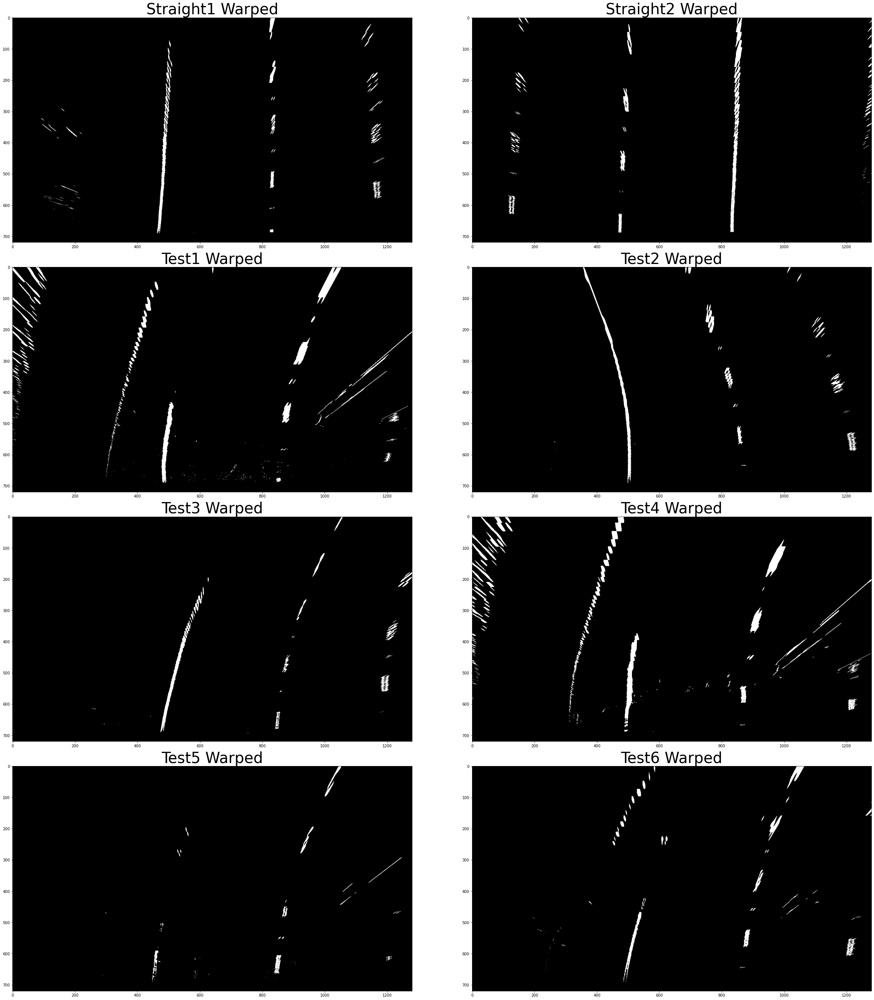

In [11]:
f, ((ax1,ax2),(ax3,ax4),(ax5,ax6),(ax7,ax8)) = plt.subplots(4, 2, figsize=(48, 18))
f.tight_layout()

warp_s1 = warp(sxsl_binary_s1)
ax1.imshow(warp_s1, cmap='gray')
ax1.set_title('Straight1 Warped', fontsize=40)

warp_s2 = warp(sxsl_binary_s2)
ax2.imshow(warp_s2, cmap='gray')
ax2.set_title('Straight2 Warped', fontsize=40)

warp_t1 = warp(sxsl_binary_t1)
ax3.imshow(warp_t1, cmap='gray')
ax3.set_title('Test1 Warped', fontsize=40)

warp_t2 = warp(sxsl_binary_t2)
ax4.imshow(warp_t2, cmap='gray')
ax4.set_title('Test2 Warped', fontsize=40)

warp_t3 = warp(sxsl_binary_t3)
ax5.imshow(warp_t3, cmap='gray')
ax5.set_title('Test3 Warped', fontsize=40)

warp_t4 = warp(sxsl_binary_t4)
ax6.imshow(warp_t4, cmap='gray')
ax6.set_title('Test4 Warped', fontsize=40)

warp_t5 = warp(sxsl_binary_t5)
ax7.imshow(warp_t5, cmap='gray')
ax7.set_title('Test5 Warped', fontsize=40)

warp_t6 = warp(sxsl_binary_t6)
ax8.imshow(warp_t6, cmap='gray')
ax8.set_title('Test6 Warped', fontsize=40)

plt.subplots_adjust(left=0., right=0.7, top=2, bottom=0.)

## Detect Lines

In [12]:
def hist(img):
    bottom_half = img[img.shape[0]//2:]
    histogram = np.sum(bottom_half, axis = 0)
    return histogram

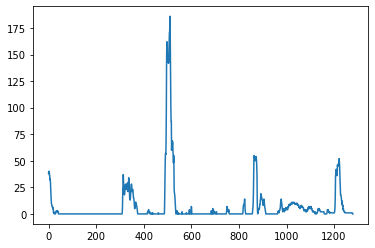

In [13]:
histogram = hist(warp_t4)
plt.plot(histogram)

In [14]:
def find_lane_pixels(binary_warped):
    
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis = 0)
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:np.int(midpoint*1.5)]) + midpoint
    
    n_windows = 9
    margin = 70
    minpix = 100
    window_height = np.int(binary_warped.shape[0]//n_windows)
    nonzero = binary_warped.nonzero()
    nonzerox = np.array(nonzero[1])
    nonzeroy = np.array(nonzero[0])
    leftx_current = leftx_base
    rightx_current = rightx_base
    leftx_diff = 0
    rightx_diff = 0
    left_lane_inds = []
    right_lane_inds = []
    
    for window in range(n_windows):
        win_y_low = binary_warped.shape[0] - (window + 1) * window_height
        win_y_high = binary_warped.shape[0] - window * window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        cv2.rectangle(out_img, (win_xleft_low, win_y_low), (win_xleft_high, win_y_high), (0,255,0), 2)
        cv2.rectangle(out_img, (win_xright_low, win_y_low), (win_xright_high, win_y_high), (0, 255, 0), 2)
        
        good_left_inds = ((nonzeroy > win_y_low) & (nonzeroy < win_y_high) & (nonzerox > win_xleft_low) 
                          & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy > win_y_low) & (nonzeroy < win_y_high) & (nonzerox > win_xright_low)
                           & (nonzerox < win_xright_high)).nonzero()[0]
        
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        if len(good_left_inds) > minpix:
            temp = np.int(np.mean(nonzerox[good_left_inds]))
            leftx_diff = temp - leftx_current
            leftx_current = temp
            
        else:
            leftx_current = leftx_current + leftx_diff
            
        if len(good_right_inds) > minpix:
            temp = np.int(np.mean(nonzerox[good_right_inds]))
            rightx_diff = temp - rightx_current
            rightx_current = temp
            
        else:
            rightx_current = rightx_current + rightx_diff
        
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    leftx = nonzerox[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    return leftx, lefty, rightx, righty, out_img

In [15]:
def fit_polynomial(binary_warped):
    
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    ploty = np.linspace(0, binary_warped.shape[0] - 1, binary_warped.shape[0])
    
    left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]
    
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    #plt.plot(left_fitx, ploty, color = 'yellow')
    #plt.plot(right_fitx, ploty, color = 'yellow')
    
    return out_img, left_fit, right_fit

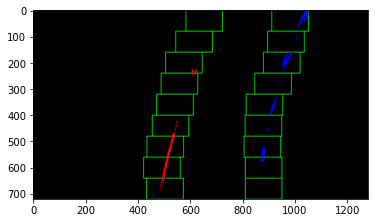

In [16]:
out_img, left_fit_prev, right_fit_prev = fit_polynomial(warp_t6)
plt.imshow(out_img)

In [23]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):
    
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    ploty = np.linspace(0, img_shape[0] - 1, img_shape[0])
    left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

In [36]:
out_img, left_fit_prev, right_fit_prev = fit_polynomial(warp_s1)
print(left_fit_prev,'\n')
print(right_fit_prev)

def tester(binary_warped):
    margin = 50
    nonzeroy, nonzerox = binary_warped.nonzero()
    
    out_img, left_fit_prev, right_fit_prev = fit_polynomial(binary_warped)
    
    left_lane_inds = ((nonzerox > left_fit_prev[0] * nonzeroy**2 + left_fit_prev[1] * nonzeroy + left_fit_prev[2] - margin)
                      & (nonzerox < left_fit_prev[0] * nonzeroy**2 + left_fit_prev[1] * nonzeroy + left_fit_prev[2] + margin))
    right_lane_inds = ((nonzerox > right_fit_prev[0] * nonzeroy**2 + right_fit_prev[1] * nonzeroy + right_fit_prev[2] - margin)
                      & (nonzerox < right_fit_prev[0] * nonzeroy**2 + right_fit_prev[1] * nonzeroy + right_fit_prev[2] + margin))
    
    leftx = nonzerox[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    return ploty

ploty = tester(warp_s1)
print("\n",max(ploty))

y = max(ploty)

xleft = left_fit_prev[0] * y**2 + left_fit_prev[1] * y + left_fit_prev[2]
xright = right_fit_prev[0] * y**2 + right_fit_prev[1] * y + right_fit_prev[2]

print('\n Width (pixels) : {:.2f}'.format(xright-xleft))
print('\n Width (meters) : {:.2f}'.format((xright-xleft)*3.7/700))

[-2.91747677e-05 -3.58326465e-02  5.07189776e+02] 

[-3.96757794e-05  2.51427431e-02  8.29869567e+02]

 719.0

 Width (pixels) : 361.09

 Width (meters) : 1.91


In [18]:
def search_around_poly(binary_warped):
    margin = 50
    nonzeroy, nonzerox = binary_warped.nonzero()
    
    out_img, left_fit_prev, right_fit_prev = fit_polynomial(binary_warped)
    
    left_lane_inds = ((nonzerox > left_fit_prev[0] * nonzeroy**2 + left_fit_prev[1] * nonzeroy + left_fit_prev[2] - margin)
                      & (nonzerox < left_fit_prev[0] * nonzeroy**2 + left_fit_prev[1] * nonzeroy + left_fit_prev[2] + margin))
    right_lane_inds = ((nonzerox > right_fit_prev[0] * nonzeroy**2 + right_fit_prev[1] * nonzeroy + right_fit_prev[2] - margin)
                      & (nonzerox < right_fit_prev[0] * nonzeroy**2 + right_fit_prev[1] * nonzeroy + right_fit_prev[2] + margin))
    
    leftx = nonzerox[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    out_img = np.dstack((binary_warped, binary_warped, binary_warped)) *255
    window_img = np.zeros_like(out_img)
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx - margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx + margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx - margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx + margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0, 255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    plt.plot(left_fitx, ploty, color = 'yellow')
    plt.plot(right_fitx, ploty, color = 'yellow')
    
    #cv2.polylines(result, np.int_([left_fitx,ploty]), False, (255, 0, 0), thickness=10)
    #cv2.polylines(result, np.int_([right_fitx,ploty]), False, (0, 0, 255), thickness=10)
    
    return result

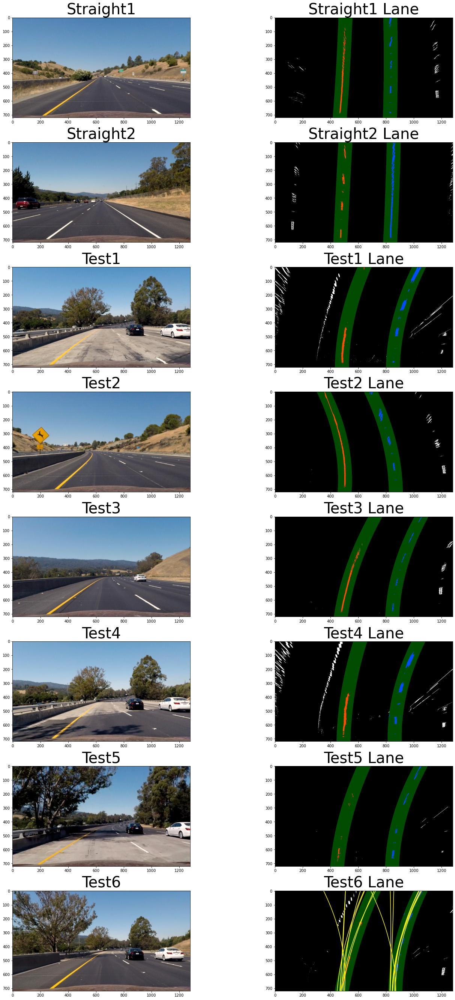

In [19]:
f, ((ax1,ax2),(ax3,ax4),(ax5,ax6),(ax7,ax8),(ax9,ax10),(ax11,ax12),(ax13,ax14),
    (ax15,ax16)) = plt.subplots(8, 2, figsize=(48, 18))
f.tight_layout()

ax1.imshow(straight1)
ax1.set_title('Straight1', fontsize=40)
lane_s1 = search_around_poly(warp_s1)
ax2.imshow(lane_s1)
ax2.set_title('Straight1 Lane', fontsize=40)

ax3.imshow(straight2)
ax3.set_title('Straight2', fontsize=40)
lane_s2 = search_around_poly(warp_s2)
ax4.imshow(lane_s2)
ax4.set_title('Straight2 Lane', fontsize=40)

ax5.imshow(test1)
ax5.set_title('Test1', fontsize=40)
lane_t1 = search_around_poly(warp_t1)
ax6.imshow(lane_t1)
ax6.set_title('Test1 Lane', fontsize=40)

ax7.imshow(test2)
ax7.set_title('Test2', fontsize=40)
lane_t2 = search_around_poly(warp_t2)
ax8.imshow(lane_t2)
ax8.set_title('Test2 Lane', fontsize=40)

ax9.imshow(test3)
ax9.set_title('Test3', fontsize=40)
lane_t3 = search_around_poly(warp_t3)
ax10.imshow(lane_t3)
ax10.set_title('Test3 Lane', fontsize=40)

ax11.imshow(test4)
ax11.set_title('Test4', fontsize=40)
lane_t4 = search_around_poly(warp_t4)
ax12.imshow(lane_t4)
ax12.set_title('Test4 Lane', fontsize=40)

ax13.imshow(test5)
ax13.set_title('Test5', fontsize=40)
lane_t5 = search_around_poly(warp_t5)
ax14.imshow(lane_t5)
ax14.set_title('Test5 Lane', fontsize=40)

ax15.imshow(test6)
ax15.set_title('Test6', fontsize=40)
lane_t6 = search_around_poly(warp_t6)
ax16.imshow(lane_t6)
ax16.set_title('Test6 Lane', fontsize=40)

plt.subplots_adjust(left=0., right=0.4, top=2, bottom=0.)

## Curvature

In [20]:
def fit_poly_real(binary_warped, xm_per_pix, ym_per_pix):
    
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    
    left_fit = np.polyfit(lefty * ym_per_pix, leftx * xm_per_pix, 2)
    right_fit = np.polyfit(righty * ym_per_pix, rightx * xm_per_pix, 2)
    ploty = np.linspace(0, binary_warped.shape[0] - 1, binary_warped.shape[0])
    
    return ploty, left_fit, right_fit

In [21]:
def measure_curvature_real(binary_warped):
    
    ym_per_pix = 30/720
    xm_per_pix = 3.7/700
    
    ploty, left_fit_prev, right_fit_prev = fit_poly_real(binary_warped, xm_per_pix, ym_per_pix)
    y_eval = np.max(ploty) * ym_per_pix
    
    left_curverad = ((1 + (2 * left_fit_prev[0] * y_eval + left_fit_prev[1])**2)**1.5)/np.abs(2 * left_fit_prev[0])
    right_curverad = ((1 + (2 * right_fit_prev[0] * y_eval + right_fit_prev[1])**2)**1.5)/np.abs(2 * right_fit_prev[0])
    
    return left_curverad, right_curverad

In [22]:
left_curverad, right_curverad = measure_curvature_real(warp_s1)
print("Radius of Curvature: {:.2f}m".format((left_curverad + right_curverad)/2))

Radius of Curvature: 4884.60m
